In [2]:
import pandas as pd
import re
import numpy as np
from nltk import word_tokenize
import nltk
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import adjusted_rand_score, homogeneity_score, completeness_score, v_measure_score
from collections import Counter


%matplotlib inline

In [3]:
lenta_df = pd.read_csv('lenta_cropped_2.csv')

In [82]:
lenta_df.head()

,text
0,"Россия, отказавшись от серийного производства ..."
1,Исследователи из Университета штата Иллинойс (...
2,В турецкой больнице скончался 57-летний украин...
3,"Девушку нашли живой через неделю после того, к..."
4,Нескольких пьяных пассажиров сняли с ночного р...


 ##### * Постройте две разные модели кластеризации с 4 кластерами (модели должны отличаться только на `random_state`)

In [9]:
bow = CountVectorizer(tokenizer=word_tokenize)
bowed_news = bow.fit_transform(lenta_df['text'])

In [11]:
model = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, n_jobs=-1, random_state=44)
model.fit(bowed_news)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=44, tol=0.0001, verbose=0)

In [12]:
model2 = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, n_jobs=-1, random_state=88)
model2.fit(bowed_news)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=88, tol=0.0001, verbose=0)

##### * По их меткам (`model.labels_`) найдите `adjusted_rand_score`.

In [13]:
labels = model.labels_ 
labels2 = model2.labels_ 

In [15]:
adjusted_rand_score(labels, labels2)

0.9996299829040771

очень хороший результат, да? возможно, это из-за того, что я поставила высокие n_init и max_iter. Или потому что random_state так попали) Поменяю только эти два параметра и посмотрю, что будет.

##### * Постройте другие две модели (с другими параметрами модели или векторизатора или другим способом векторизации текста способ векторизации).

In [87]:
model3 = KMeans(n_clusters=4, init='k-means++', max_iter=100, n_init=2, n_jobs=-1, random_state=44)
model3.fit(bowed_news)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=4, n_init=2, n_jobs=-1, precompute_distances='auto',
    random_state=44, tol=0.0001, verbose=0)

In [17]:
model4 = KMeans(n_clusters=4, init='k-means++', max_iter=100, n_init=2, n_jobs=-1, random_state=88)
model4.fit(bowed_news)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=4, n_init=2, n_jobs=-1, precompute_distances='auto',
    random_state=88, tol=0.0001, verbose=0)

##### * Посчитайте `adjusted_rand_score` для них тоже.

In [18]:
adjusted_rand_score(model3.labels_, model4.labels_)

0.9928808058816917

Практически такой же хороший результат. поставлю n_init равный 1, это точно должно быть хуже

In [19]:
model5 = KMeans(n_clusters=4, init='k-means++', max_iter=100, n_init=1, n_jobs=-1, random_state=44)
model5.fit(bowed_news)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=4, n_init=1, n_jobs=-1, precompute_distances='auto',
    random_state=44, tol=0.0001, verbose=0)

In [20]:
model6 = KMeans(n_clusters=4, init='k-means++', max_iter=100, n_init=1, n_jobs=-1, random_state=88)
model6.fit(bowed_news)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=4, n_init=1, n_jobs=-1, precompute_distances='auto',
    random_state=88, tol=0.0001, verbose=0)

In [21]:
adjusted_rand_score(model5.labels_, model6.labels_)

0.3839919588642234

да! дело было в n-init (Number of time the k-means algorithm will be run with different centroid seeds.) 
Значит, n_init = 2 было вполне достаточно. n_init = 10 ставить в данном случае незачем.

### Word Cloud

##### Для текстов двух кластеров (любой модели) постройте wordcloud (для каждого свой). 


In [25]:
!python -m pip install wordcloud

You are using pip version 10.0.1, however version 19.0.3 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [33]:
from wordcloud import WordCloud

Достанем тексты кластеров

In [26]:
third_cluster_indices = [ind for ind, label in enumerate(model.labels_) if label == 3]
third_cluster_rows = lenta_df.iloc[third_cluster_indices]
third_cluster_rows.head()

,text
0,"Россия, отказавшись от серийного производства ..."
1,Исследователи из Университета штата Иллинойс (...
2,В турецкой больнице скончался 57-летний украин...
25,Жительница Китая купила в интернете ядовитую з...
28,Специалисты в индустрии путешествий рассказали...


In [29]:
len(third_cluster_rows)

11191

In [28]:
first_cluster_indices = [ind for ind, label in enumerate(model.labels_) if label == 1]
first_cluster_rows = lenta_df.iloc[first_cluster_indices]
first_cluster_rows.head()

,text
6,"Британец возместил ущерб от кражи шоколадок, к..."
7,Американский телеканал CNBC со ссылкой на свои...
8,Судьи Верховного индийского суда пригрозили сн...
12,Археологи обнаружили мастерскую для проведения...
14,"Ученые Университета штата Орегон выяснили, что..."


In [30]:
len(first_cluster_rows)

17044

In [37]:
stopwords.words('russian')

['и',
 'в',
 'во',
 'не',
 'что',
 'он',
 'на',
 'я',
 'с',
 'со',
 'как',
 'а',
 'то',
 'все',
 'она',
 'так',
 'его',
 'но',
 'да',
 'ты',
 'к',
 'у',
 'же',
 'вы',
 'за',
 'бы',
 'по',
 'только',
 'ее',
 'мне',
 'было',
 'вот',
 'от',
 'меня',
 'еще',
 'нет',
 'о',
 'из',
 'ему',
 'теперь',
 'когда',
 'даже',
 'ну',
 'вдруг',
 'ли',
 'если',
 'уже',
 'или',
 'ни',
 'быть',
 'был',
 'него',
 'до',
 'вас',
 'нибудь',
 'опять',
 'уж',
 'вам',
 'ведь',
 'там',
 'потом',
 'себя',
 'ничего',
 'ей',
 'может',
 'они',
 'тут',
 'где',
 'есть',
 'надо',
 'ней',
 'для',
 'мы',
 'тебя',
 'их',
 'чем',
 'была',
 'сам',
 'чтоб',
 'без',
 'будто',
 'чего',
 'раз',
 'тоже',
 'себе',
 'под',
 'будет',
 'ж',
 'тогда',
 'кто',
 'этот',
 'того',
 'потому',
 'этого',
 'какой',
 'совсем',
 'ним',
 'здесь',
 'этом',
 'один',
 'почти',
 'мой',
 'тем',
 'чтобы',
 'нее',
 'сейчас',
 'были',
 'куда',
 'зачем',
 'всех',
 'никогда',
 'можно',
 'при',
 'наконец',
 'два',
 'об',
 'другой',
 'хоть',
 'после',
 'на

In [52]:
cloud_words = ''
for text in first_cluster_rows.text:
    text = text.lower()
#     for words in text:
    cloud_words = cloud_words + text + ' '
# print(cloud_words)
    

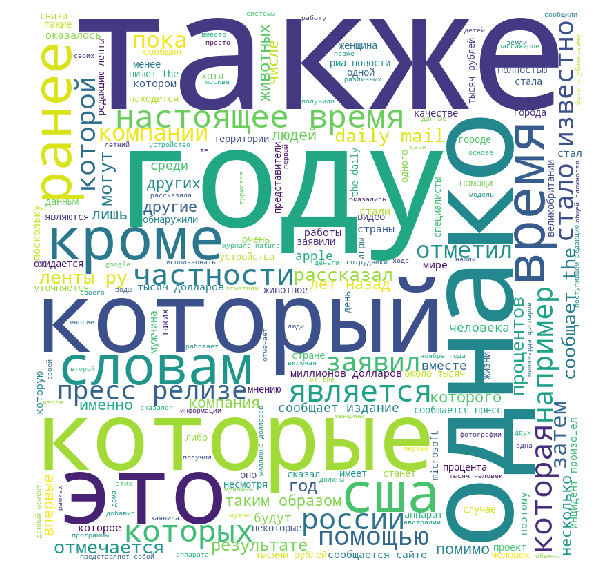

In [53]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords.words('russian'), 
                min_font_size = 10).generate(cloud_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

Слова получились совершенно ни о чем не говорящие. По-хорошему нужно тексты сначала прогнать через лемматизатор, 
чтобы все стоп-слова улавливались.

Для третьего кластера сначала посмотрю слова с помощью частотного словаря

In [54]:
corpus_third_claster = [token for text in third_cluster_rows.text for token in word_tokenize(str(text).lower()) if token not in stopwords.words('russian')]
print(len(corpus_third_claster))

2423432


In [58]:
freq_dict_third_claster = Counter(corpus_third_claster)
freq_dict_third_claster.most_common(200)

[(',', 225831),
 ('.', 159385),
 ('«', 20531),
 ('»', 20525),
 (')', 18219),
 ('(', 18214),
 ('—', 15270),
 ('года', 8519),
 ('также', 8280),
 ('``', 6901),
 ("''", 6861),
 ('году', 6670),
 ('это', 6351),
 ('однако', 5932),
 ('ученые', 5891),
 ('время', 5462),
 (':', 5304),
 ('которые', 5283),
 ('сообщает', 4409),
 ('-', 4219),
 ('лет', 4186),
 ('который', 4092),
 ('словам', 3875),
 ('сша', 3445),
 ('the', 3393),
 ('тысяч', 3371),
 ('ранее', 3007),
 ('россии', 2924),
 ('долларов', 2757),
 ('около', 2738),
 ('является', 2733),
 ('игры', 2702),
 ('которая', 2643),
 ('компании', 2588),
 ('компания', 2544),
 ('пока', 2526),
 ('несколько', 2411),
 ('будут', 2394),
 ('процентов', 2340),
 ('из-за', 2310),
 ('кроме', 2258),
 ('которых', 2176),
 ('могут', 2173),
 ('журнале', 1996),
 ('of', 1955),
 ('сайте', 1933),
 ('заявил', 1894),
 ('ученых', 1863),
 ('например', 1785),
 ('которой', 1783),
 ('2012', 1769),
 ('других', 1744),
 ('человек', 1737),
 ('университета', 1705),
 ('удалось', 1675),
 ('

По самым частотным словам тоже непонятно, о чем речь, просто какие-то новости. Попробую скачать более полный список стоп-слов
https://github.com/stopwords-iso/stopwords-ru

In [4]:
with open('stopwords-ru.txt', encoding='utf-8') as f:
    content = f.readlines()
stopwords_full = [x.strip() for x in content] 

In [69]:
stopwords_full

['c',
 'а',
 'алло',
 'без',
 'белый',
 'близко',
 'более',
 'больше',
 'большой',
 'будем',
 'будет',
 'будете',
 'будешь',
 'будто',
 'буду',
 'будут',
 'будь',
 'бы',
 'бывает',
 'бывь',
 'был',
 'была',
 'были',
 'было',
 'быть',
 'в',
 'важная',
 'важное',
 'важные',
 'важный',
 'вам',
 'вами',
 'вас',
 'ваш',
 'ваша',
 'ваше',
 'ваши',
 'вверх',
 'вдали',
 'вдруг',
 'ведь',
 'везде',
 'вернуться',
 'весь',
 'вечер',
 'взгляд',
 'взять',
 'вид',
 'видел',
 'видеть',
 'вместе',
 'вне',
 'вниз',
 'внизу',
 'во',
 'вода',
 'война',
 'вокруг',
 'вон',
 'вообще',
 'вопрос',
 'восемнадцатый',
 'восемнадцать',
 'восемь',
 'восьмой',
 'вот',
 'впрочем',
 'времени',
 'время',
 'все',
 'все еще',
 'всегда',
 'всего',
 'всем',
 'всеми',
 'всему',
 'всех',
 'всею',
 'всю',
 'всюду',
 'вся',
 'всё',
 'второй',
 'вы',
 'выйти',
 'г',
 'где',
 'главный',
 'глаз',
 'говорил',
 'говорит',
 'говорить',
 'год',
 'года',
 'году',
 'голова',
 'голос',
 'город',
 'да',
 'давать',
 'давно',
 'даже',
 'д

In [66]:
cloud_words_third = ''
for text in third_cluster_rows.text:
    text = text.lower()
    cloud_words_third = cloud_words_third + text + ' '
print(len(cloud_words_third))
    

19024100


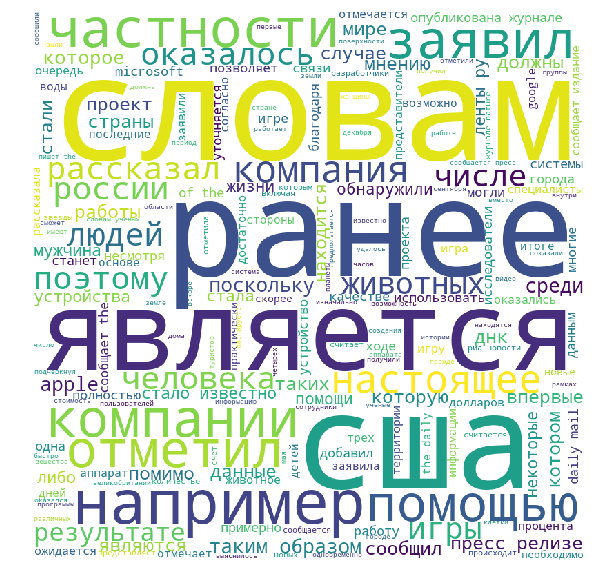

In [67]:
wordcloud_third = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords_full, 
                min_font_size = 10).generate(cloud_words_third) 
  
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud_third) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

С расширенными стоп-словами лучше, но всё равно непонятно, о чем новости.

Пойду в пайчарм и сделаю лемматизацию для второго кластера.

In [59]:
second_cluster_indices = [ind for ind, label in enumerate(model.labels_) if label == 2]
second_cluster_rows = lenta_df.iloc[second_cluster_indices]
second_cluster_rows.head()

,text
3,"Девушку нашли живой через неделю после того, к..."
4,Нескольких пьяных пассажиров сняли с ночного р...
5,"Американская супермодель Кейт Аптон, названная..."
9,Бывшая чиновница Минобороны России Евгения Вас...
10,"Американский журнал National Interest заявил, ..."


In [61]:
second_cluster_rows.to_csv('second_cluster_rows.csv', index=False)

In [ ]:
КОД ИЗ ПАЙЧАРМА:
from nltk.tokenize import word_tokenize
from string import punctuation
import pandas as pd
from nltk.corpus import stopwords
from pymorphy2 import MorphAnalyzer
lemmatizator = MorphAnalyzer()

second_cluster_rows = pd.read_csv('second_cluster_rows.csv')
noise = stopwords.words('russian')+list(punctuation)
corpus_second_claster = [token for text in second_cluster_rows.text for token in word_tokenize(str(text).lower()) if token not in noise]
corpus_second_lemmatized = [lemmatizator.parse(word)[0].normal_form for word in corpus_second_claster]
with open('corpus_second_lemmatized.txt', 'w', encoding='utf-8') as f:
    print(*corpus_second_lemmatized, file=f)

In [70]:
with open('corpus_second_lemmatized.txt', encoding='utf-8') as f:
    cloud_words_second = f.read()


In [71]:
cloud_words_second

"девушка найти живой неделя машина упасть 60-метровый скала сообщать bbc news американка отправиться автомобиль портленд лос-анджелес сестра ехать прибрежный шоссе калифорния резко повернуть избежать столкновение животный из-за машина вылететь дорога найти турист который заметить район биг-сура упасть автомобиль американка удаться выжить благодаря тот пила вода радиатор разбиться машина сознание сильно повредить плечо отметить представитель полиция город монтерь джон торнбург девушка повезти остаться живой подобный случай человек разбиваться уносить океан июль популярный блогер погибнуть канада сорваться уступ вершина водопад несколько пьяный пассажир снять ночное рейс уфа москва из-за неадекватный поведение сообщать « интерфакс » информация агентство шестеро пассажир который должный лететь самолёт авиакомпания s7 выпивать кафе аэропорт переусердствовать алкоголь борт воздушный судный начать вести неадекватно командир корабль отказаться везти дебошир рейс снять шесть человек один оказа

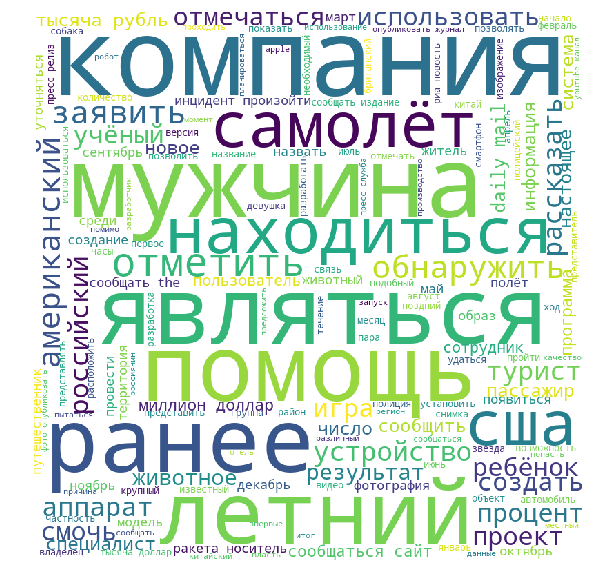

In [72]:
wordcloud_second = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords_full, 
                min_font_size = 10).generate(cloud_words_second) 
  
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud_second) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

Тоже непонятно о чем, и глаголы очень мешают, совершенно несодержательные. Уберу из списка слов глаголы

In [ ]:
КОД ИЗ ПАЙЧАРМА:
second_cluster_rows = pd.read_csv('second_cluster_rows.csv')
noise = stopwords.words('russian')+list(punctuation)
corpus_second_claster = [token for text in second_cluster_rows.text for token in word_tokenize(str(text).lower()) if token not in noise]
corpus_second_lemmatized_VERBSFREE = \
     [lemmatizator.parse(word)[0].normal_form for word in corpus_second_claster
      if ('VERB' not in str(lemmatizator.parse(word)[0].tag))and('INFN' not in str(lemmatizator.parse(word)[0].tag))]
with open('corpus_second_lemmatized_VERBSFREE.txt', 'w', encoding='utf-8') as f:
     print(*corpus_second_lemmatized_VERBSFREE, file=f)


In [73]:
with open('corpus_second_lemmatized_VERBSFREE.txt', encoding='utf-8') as f:
    cloud_words_second_VERBSFREE = f.read()

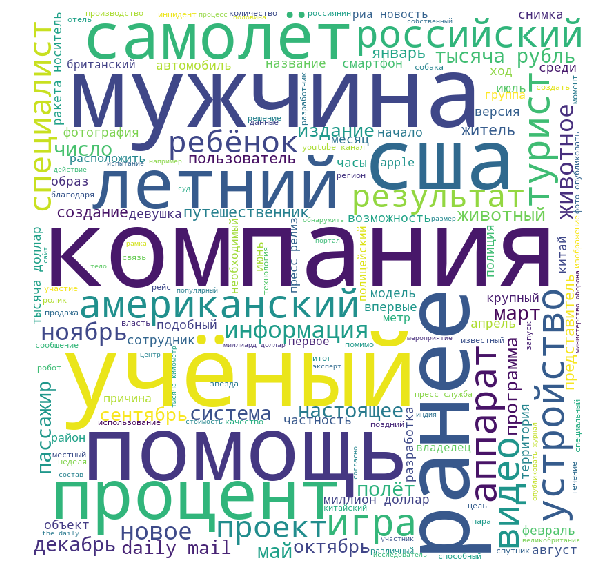

In [74]:
wordcloud_second_VERBSFREE = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords_full, 
                min_font_size = 10).generate(cloud_words_second_VERBSFREE) 
  
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud_second_VERBSFREE) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

Всё равно по словам ничего конкретно-осмысленного определить нельзя. 
Сделаю такой же word cloud для первого кластера и попробую сравнить

In [75]:
first_cluster_rows.to_csv('first_cluster_rows.csv', index=False)

In [ ]:
КОД ИЗ ПАЙЧАРМА:
    from nltk.tokenize import word_tokenize
from string import punctuation
import pandas as pd
from nltk.corpus import stopwords
from pymorphy2 import MorphAnalyzer
lemmatizator = MorphAnalyzer()
first_cluster_rows = pd.read_csv('first_cluster_rows.csv')
noise = stopwords.words('russian')+list(punctuation)
corpus_first_claster = [token for text in first_cluster_rows.text for token in word_tokenize(str(text).lower()) if token not in noise]
corpus_first_lemmatized_VERBSFREE = \
     [lemmatizator.parse(word)[0].normal_form for word in corpus_first_claster
      if ('VERB' not in str(lemmatizator.parse(word)[0].tag))and('INFN' not in str(lemmatizator.parse(word)[0].tag))]
with open('corpus_first_lemmatized_VERBSFREE.txt', 'w', encoding='utf-8') as f:
     print(*corpus_first_lemmatized_VERBSFREE, file=f)

In [76]:
with open('corpus_first_lemmatized_VERBSFREE.txt', encoding='utf-8') as f:
    cloud_words_first_VERBSFREE = f.read()

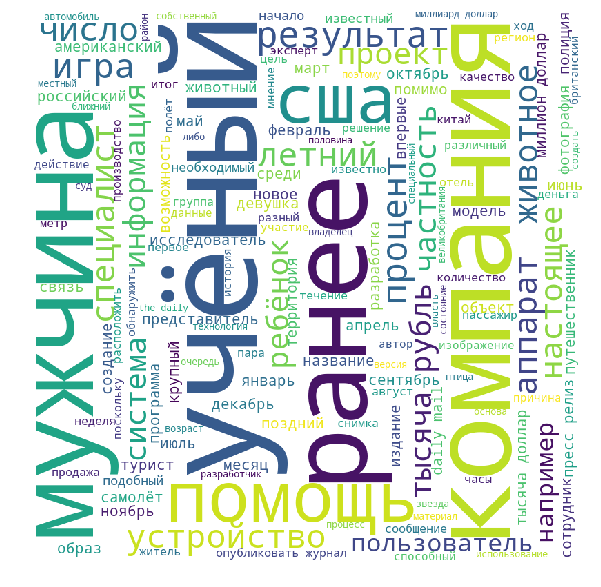

In [77]:
wordcloud_first_VERBSFREE = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords_full, 
                min_font_size = 10).generate(cloud_words_first_VERBSFREE) 
  
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud_first_VERBSFREE) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

самые большие слова - те же самые. Пожалуй, я их добавлю в список стоп-слов

In [5]:
more_stopwords = ['мужчина', "учёный", "ранее", "помощь", "компания"]
for el in more_stopwords:
    stopwords_full.append(el)

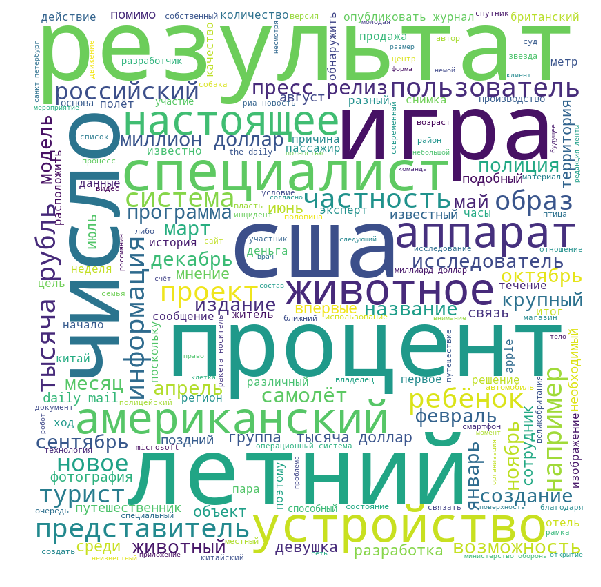

In [80]:
wordcloud_first_VERBSFREE = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords_full, 
                min_font_size = 10).generate(cloud_words_first_VERBSFREE) 
  
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud_first_VERBSFREE) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

И облако для второго кластера с новыми стопсловами:
    

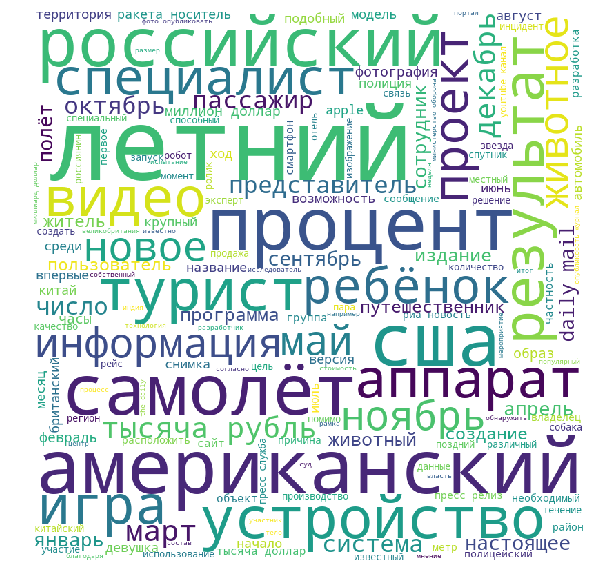

In [81]:
wordcloud_second_VERBSFREE = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords_full, 
                min_font_size = 10).generate(cloud_words_second_VERBSFREE) 
  
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud_second_VERBSFREE) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

Попробую еще проделать это с тф-дф векторайзером, посмотрю, что получится.

In [3]:
bow_tfidf = TfidfVectorizer(tokenizer=word_tokenize)
bowed_news_tfidf = bow_tfidf.fit_transform(lenta_df['text'])

In [4]:
model7 = KMeans(n_clusters=4, init='k-means++', max_iter=100, n_init=3, n_jobs=-1, random_state=44)
model7.fit(bowed_news_tfidf)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=4, n_init=3, n_jobs=-1, precompute_distances='auto',
    random_state=44, tol=0.0001, verbose=0)

In [5]:
model8 = KMeans(n_clusters=4, init='k-means++', max_iter=100, n_init=3, n_jobs=-1, random_state=88)
model8.fit(bowed_news_tfidf)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=4, n_init=3, n_jobs=-1, precompute_distances='auto',
    random_state=88, tol=0.0001, verbose=0)

In [8]:
adjusted_rand_score(model7.labels_, model8.labels_)

0.2679222114571127

результат плохой. запихну стоп-слова в векторайзер

In [6]:
bow_tfidf2 = TfidfVectorizer(tokenizer=word_tokenize, stop_words = stopwords_full)
bowed_news_tfidf2 = bow_tfidf2.fit_transform(lenta_df['text'])

In [11]:
model9 = KMeans(n_clusters=4, init='k-means++', max_iter=150, n_init=3, n_jobs=-1, random_state=44)
model9.fit(bowed_news_tfidf2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=150,
    n_clusters=4, n_init=3, n_jobs=-1, precompute_distances='auto',
    random_state=44, tol=0.0001, verbose=0)

In [12]:
model10 = KMeans(n_clusters=4, init='k-means++', max_iter=150, n_init=3, n_jobs=-1, random_state=88)
model10.fit(bowed_news_tfidf2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=150,
    n_clusters=4, n_init=3, n_jobs=-1, precompute_distances='auto',
    random_state=88, tol=0.0001, verbose=0)

In [13]:
adjusted_rand_score(model9.labels_, model10.labels_)

0.43463867495875375

результат лучше. возможно, стоит поэкспериментировать с n_init

In [7]:
model11 = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, n_jobs=-1, random_state=44)
model11.fit(bowed_news_tfidf2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=44, tol=0.0001, verbose=0)

In [8]:
model12 = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, n_jobs=-1, random_state=88)
model12.fit(bowed_news_tfidf2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=88, tol=0.0001, verbose=0)

In [9]:
adjusted_rand_score(model11.labels_, model12.labels_)

0.3760460185277303

In [ ]:
нет, стало только хуже. нет смысла возиться с tf-idf векторизатором.